<a href="https://colab.research.google.com/github/kushal8112/FraudDetection/blob/main/KidneyChronicDisease.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## KIDNEY CHRONIC DISEASE

### Installing and importing required libraries

In [ ]:
# !pip install ucimlrepo
!pip install theano
!pip install pymc3

In [ ]:
st = "My current project, which is Portfolio Optimization tool consists of building a tool to optimize asset allocation, minimize risk, and enhance returns in alignment with investment goals by employing different quantitative methods like, Mean Variance model, Hierarchical Risk Parity and Hierarchical Equal Risk Contribution. This project has already given me hands on experience in the topics like mean-variance portfolio theory, which aligns with this project. Also, I have taken relevant financial mathematics courses on NPTEL, such as “Quantitative Finance: IIT Kanpur” and “Financial Mathematics: IITR” (certification in progress). In this courses, different topics like basic theory of interest, fixed income securities, pricing of stocks and options, Black-Scholes-Merton model were introduced, which also align with this project. I have also completely multiple other courses in mathematics like Basics of Statistics: University of Amsterdam, Probability and Statistics: NITK Surathkal, Numerical Methods: NITK Surathkal, Multivariate Calculus: Khan Academy. Currently, I am referring Introduction to Stochastic Calculus for Finance by Dieter Sondermann to learn more about stochastic finance."
print(len(st.split(" ")))

162


In [ ]:
# import os
# os.environ["MKL_THREADING_LAYER"] = "GNU"
# os.environ["OMP_NUM_THREADS"] = "1"
import pymc as pm
import arviz as az

### Importing the required libraries

In [ ]:
import pandas as pd
import seaborn as sns
import warnings
import copy
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import roc_curve, auc
from sklearn.decomposition import PCA
from sklearn.pipeline import make_pipeline
from sklearn.impute import KNNImputer
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [ ]:
# from ucimlrepo import fetch_ucirepo

# # fetch dataset
# chronic_kidney_disease = fetch_ucirepo(id=336)

# # data (as pandas dataframes)
# X = pd.DataFrame(chronic_kidney_disease.data.features)
# y = pd.DataFrame(chronic_kidney_disease.data.targets)

# # metadata
# print(chronic_kidney_disease.metadata)

# # variable information
# print(chronic_kidney_disease.variables)

# data = pd.concat([X,y], axis=1)
# data.head(10)

Pre-processing

In [ ]:
data = pd.read_csv("/content/kidney_disease.csv")
X = data.drop(columns =['classification'], inplace=False)
y = data['classification']

In [ ]:
data.describe()

,id,age,bp,sg,al,su,bgr,bu,sc,sod,pot,hemo
count,400.000000,391.000000,388.000000,353.000000,354.000000,351.000000,356.000000,381.000000,383.000000,313.000000,312.000000,348.000000
mean,199.500000,51.483376,76.469072,1.017408,1.016949,0.450142,148.036517,57.425722,3.072454,137.528754,4.627244,12.526437
std,115.614301,17.169714,13.683637,0.005717,1.352679,1.099191,79.281714,50.503006,5.741126,10.408752,3.193904,2.912587
min,0.000000,2.000000,50.000000,1.005000,0.000000,0.000000,22.000000,1.500000,0.400000,4.500000,2.500000,3.100000
25%,99.750000,42.000000,70.000000,1.010000,0.000000,0.000000,99.000000,27.000000,0.900000,135.000000,3.800000,10.300000
50%,199.500000,55.000000,80.000000,1.020000,0.000000,0.000000,121.000000,42.000000,1.300000,138.000000,4.400000,12.650000
75%,299.250000,64.500000,80.000000,1.020000,2.000000,0.000000,163.000000,66.000000,2.800000,142.000000,4.900000,15.000000
max,399.000000,90.000000,180.000000,1.025000,5.000000,5.000000,490.000000,391.000000,76.000000,163.000000,47.000000,17.800000


In [ ]:
print("There are {} columns (including the target variables) and the list include: \n".format(len(data.columns)),list(data.columns))

There are 26 columns (including the target variables) and the list include: 
 ['id', 'age', 'bp', 'sg', 'al', 'su', 'rbc', 'pc', 'pcc', 'ba', 'bgr', 'bu', 'sc', 'sod', 'pot', 'hemo', 'pcv', 'wc', 'rc', 'htn', 'dm', 'cad', 'appet', 'pe', 'ane', 'classification']


### Check out the unique values of each variable in the dataset

In [ ]:
#checking for missing values and the values to be replaced
for i in data.columns:
  print("\n The uniques values of {} are \n".format(i), data[i].unique())


 The uniques values of id are 
 [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233
 234 235 236 237 2

In [ ]:
# #replacing the values
# data['classification'] = data['classification'].replace({'ckd\t':'yes','ckd':'yes','notckd':'no'})
# data.dm = data.dm.replace({'\tno':'no'})
# data.head(10)

### Data cleaning (cleaning the unwanted labels)

In [ ]:
for i in range(data.shape[0]):
    if data.iloc[i,25]=='ckd\t':
        data.iloc[i,25]='ckd'
    if data.iloc[i,20] in [' yes','\tyes']:
        data.iloc[i,20]='yes'
    if data.iloc[i,20]=='\tno':
        data.iloc[i,20]='no'
    if data.iloc[i,21]=='\tno':
        data.iloc[i,21]='no'
    if data.iloc[i,16]=='\t?':
        data.iloc[i,16]=np.nan
    if data.iloc[i,16]=='\t43':
        data.iloc[i,16]='43'
    if data.iloc[i,17]=='\t?':
        data.iloc[i,17]=np.nan
    if data.iloc[i,17]=='\t6200':
        data.iloc[i,17]= '6200'
    if data.iloc[i,17]=='\t8400':
        data.iloc[i,17]= '6200'
    if data.iloc[i,18]=='\t?':
        data.iloc[i,18]=np.nan
    if data.iloc[i,25]=='ckd':
        data.iloc[i,25]='yes'
    if data.iloc[i,25]=='notckd':
        data.iloc[i,25]='no'
data.drop(columns =['id'], inplace=True)

In [ ]:
feature_names=['Age (yrs)','Blood Pressure (mm/Hg)','Specific Gravity','Albumin','Sugar','Red Blood Cells',
               'Pus Cells','Pus Cell Clumps','Bacteria','Blood Glucose Random (mgs/dL)','Blood Urea (mgs/dL)',
               'Serum Creatinine (mgs/dL)','Sodium (mEq/L)','Potassium (mEq/L)','Hemoglobin (gms)','Packed Cell Volume',
               'White Blood Cells (cells/cmm)','Red Blood Cells (millions/cmm)','Hypertension','Diabetes Mellitus',
               'Coronary Artery Disease','Appetite','Pedal Edema','Anemia','Chronic Kidney Disease']
data.columns=feature_names
for i in data.columns:
  print("\n The uniques values of {} are \n".format(i)," and the type of ",data[i].unique())


 The uniques values of Age (yrs) are 
  and the type of  [48.  7. 62. 51. 60. 68. 24. 52. 53. 50. 63. 40. 47. 61. 21. 42. 75. 69.
 nan 73. 70. 65. 76. 72. 82. 46. 45. 35. 54. 11. 59. 67. 15. 55. 44. 26.
 64. 56.  5. 74. 38. 58. 71. 34. 17. 12. 43. 41. 57.  8. 39. 66. 81. 14.
 27. 83. 30.  4.  3.  6. 32. 80. 49. 90. 78. 19.  2. 33. 36. 37. 23. 25.
 20. 29. 28. 22. 79.]

 The uniques values of Blood Pressure (mm/Hg) are 
  and the type of  [ 80.  50.  70.  90.  nan 100.  60. 110. 140. 180. 120.]

 The uniques values of Specific Gravity are 
  and the type of  [1.02  1.01  1.005 1.015   nan 1.025]

 The uniques values of Albumin are 
  and the type of  [ 1.  4.  2.  3.  0. nan  5.]

 The uniques values of Sugar are 
  and the type of  [ 0.  3.  4.  1. nan  2.  5.]

 The uniques values of Red Blood Cells are 
  and the type of  [nan 'normal' 'abnormal']

 The uniques values of Pus Cells are 
  and the type of  ['normal' 'abnormal' nan]

 The uniques values of Pus Cell Clumps are 
  and th

### The dataset is cleaned but has NaN values. We can use imputers to overcome this issue.

In [ ]:
mistyped=['Packed Cell Volume','White Blood Cells (cells/cmm)','Red Blood Cells (millions/cmm)']
numeric=[]
for i in data.columns:
    if data[i].dtype=='float64':
        numeric.append(i)
numeric=numeric+mistyped
for col in mistyped:
        data[col]=data[col].astype('float')
print(data['Packed Cell Volume'].unique())
print(data['White Blood Cells (cells/cmm)'].unique())
print(data['Red Blood Cells (millions/cmm)'].unique())

[44. 38. 31. 32. 35. 39. 36. 33. 29. 28. nan 16. 24. 37. 30. 34. 40. 45.
 27. 48. 52. 14. 22. 18. 42. 17. 46. 23. 19. 25. 41. 26. 15. 21. 43. 20.
 47.  9. 49. 50. 53. 51. 54.]
[ 7800.  6000.  7500.  6700.  7300.    nan  6900.  9600. 12100.  4500.
 12200. 11000.  3800. 11400.  5300.  9200.  6200.  8300.  8400. 10300.
  9800.  9100.  7900.  6400.  8600. 18900. 21600.  4300.  8500. 11300.
  7200.  7700. 14600.  6300.  7100. 11800.  9400.  5500.  5800. 13200.
 12500.  5600.  7000. 11900. 10400. 10700. 12700.  6800.  6500. 13600.
 10200.  9000. 14900.  8200. 15200.  5000. 16300. 12400. 10500.  4200.
  4700. 10900.  8100.  9500.  2200. 12800. 11200. 19100. 12300. 16700.
  2600. 26400.  8800.  7400.  4900.  8000. 12000. 15700.  4100.  5700.
 11500.  5400. 10800.  9900.  5200.  5900.  9300.  9700.  5100.  6600.]
[5.2 nan 3.9 4.6 4.4 5.  4.  3.7 3.8 3.4 2.6 2.8 4.3 3.2 3.6 4.1 4.9 2.5
 4.2 4.5 3.1 4.7 3.5 6.  2.1 5.6 2.3 2.9 2.7 8.  3.3 3.  2.4 4.8 5.4 6.1
 6.2 6.3 5.1 5.8 5.5 5.3 6.4 5.7 5.9 6

In [ ]:
df = data.copy()
#missing values
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 25 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Age (yrs)                       391 non-null    float64
 1   Blood Pressure (mm/Hg)          388 non-null    float64
 2   Specific Gravity                353 non-null    float64
 3   Albumin                         354 non-null    float64
 4   Sugar                           351 non-null    float64
 5   Red Blood Cells                 248 non-null    object 
 6   Pus Cells                       335 non-null    object 
 7   Pus Cell Clumps                 396 non-null    object 
 8   Bacteria                        396 non-null    object 
 9   Blood Glucose Random (mgs/dL)   356 non-null    float64
 10  Blood Urea (mgs/dL)             381 non-null    float64
 11  Serum Creatinine (mgs/dL)       383 non-null    float64
 12  Sodium (mEq/L)                  313 

### Number of missing values in numerical features

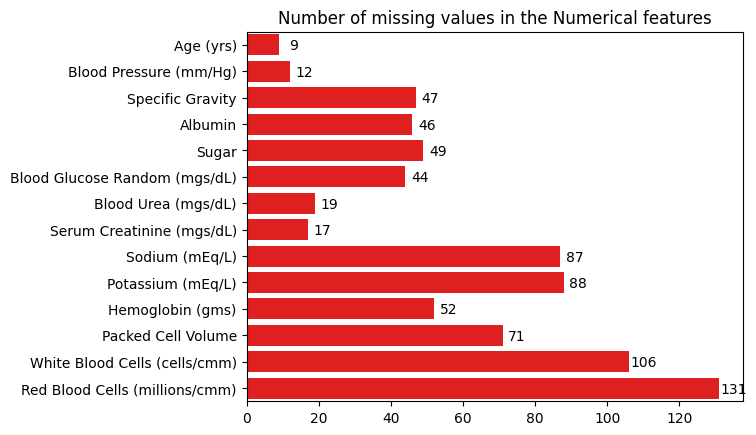

In [ ]:
numerical = []
missing_values_count = []
for i in data.columns:
  if data[i].dtype == 'float64':
    numerical.append(i)
    missing_values_count.append(data[i].isnull().sum())
numerical_data = pd.DataFrame(zip(numerical, missing_values_count))
sns.barplot(x=missing_values_count, y=numerical, data=numerical_data, color='r')
for index, value in enumerate(numerical_data[1]):
    plt.text(value+4, index+0.3, str(value), ha='center', va='bottom')
plt.title('Number of missing values in the Numerical features')
plt.show;

### Number of missing values in categorical features

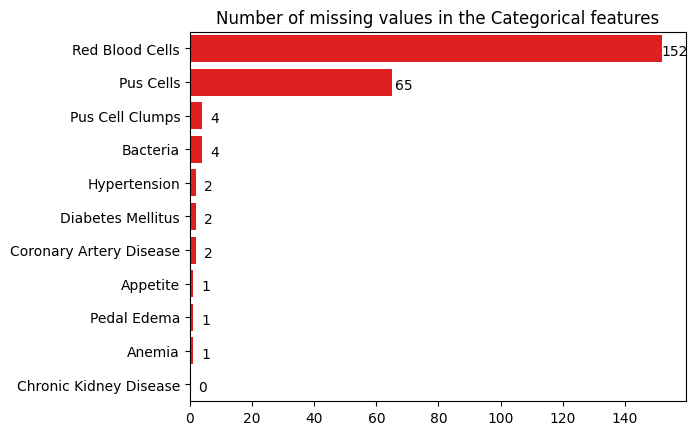

In [ ]:
categorical = []
missing_categorical_values_count = []
for i in data.columns:
  if data[i].dtype != 'float64':
    categorical.append(i)
    missing_categorical_values_count.append(data[i].isnull().sum())
categorical_data = pd.DataFrame(zip(categorical, missing_categorical_values_count))
sns.barplot(x=missing_categorical_values_count, y=categorical, data=categorical_data, color='r')
for index, value in enumerate(categorical_data[1]):
    plt.text(value+4, index+0.3, str(value), ha='center', va='bottom')
plt.title('Number of missing values in the Categorical features')
plt.show;

### Probability distribution of numerical features

<ipython-input-17-5bb57291c951>:11: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  fig = sns.distplot(data[col], color="g", label=column_label, norm_hist=True, ax=axes[i,j], kde_kws={"lw":4})
<ipython-input-17-5bb57291c951>:11: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  fig = sns.distplot(data[col], color="g", label=co

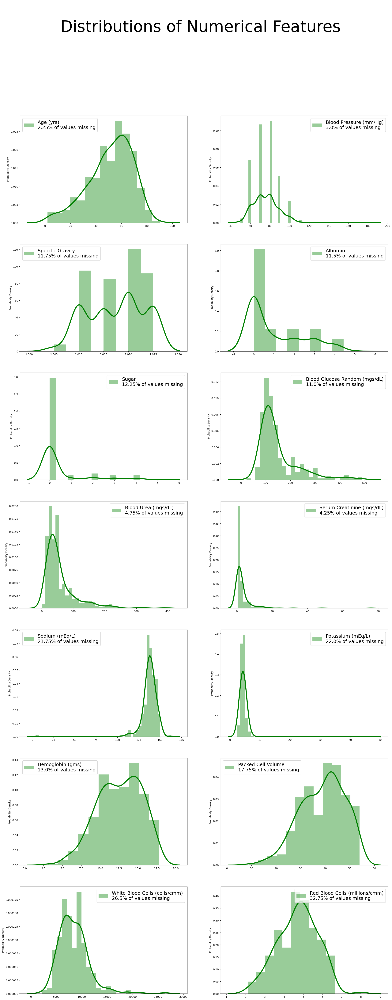

In [ ]:
n_col = 2
n_row = 7
figure, axes = plt.subplots(n_row, n_col, figsize=(25, 60))
figure.suptitle('\n Distributions of Numerical Features', fontsize=60)

k=0
for index, col in enumerate(numerical):
  i,j= index // n_col, index % n_col
  missing_percentage = missing_values_count[k]*100/400
  column_label = col + "\n{}% of values missing".format(missing_percentage)
  fig = sns.distplot(data[col], color="g", label=column_label, norm_hist=True, ax=axes[i,j], kde_kws={"lw":4})
  fig=fig.legend(loc='best', fontsize=18)
  axes[i,j].set_ylabel("Probability Density",fontsize='medium')
  axes[i,j].set_xlabel(None)
  k+=1
warnings.filterwarnings("ignore")
plt.show()

### Countplot of categorical features

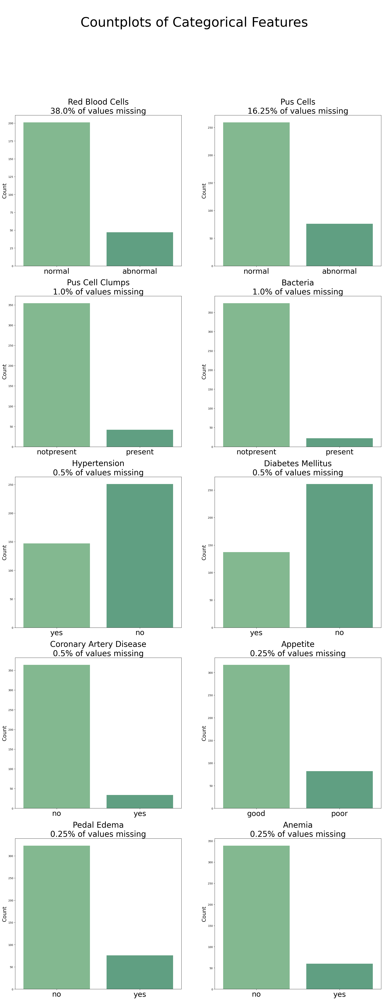

In [ ]:
n_col = 2
n_row = 5
figure, axes = plt.subplots(n_row, n_col, figsize=(25, 60))
figure.suptitle('\n Countplots of Categorical Features', fontsize=50)
categoricals = categorical[:-1]

k=0
for index, col in enumerate(categoricals):
  i,j= index // n_col, index % n_col
  missing_percentage = missing_categorical_values_count[k]*100/400
  column_label = col + "\n{}% of values missing".format(missing_percentage)
  fig = sns.countplot(x=col, data=data,label=column_label, palette=sns.cubehelix_palette(rot=-.50,light=0.65,hue=1),ax=axes[i,j])
  axes[i,j].set_title(column_label,fontsize=30)
  axes[i,j].set_xlabel(None)
  axes[i,j].set_ylabel("Count",fontsize=20)
  axes[i,j].set_xticklabels(axes[i,j].get_xticklabels(), fontsize=28)
  k+=1
warnings.filterwarnings("ignore")
plt.show()

### Countplot of the categorical target feature

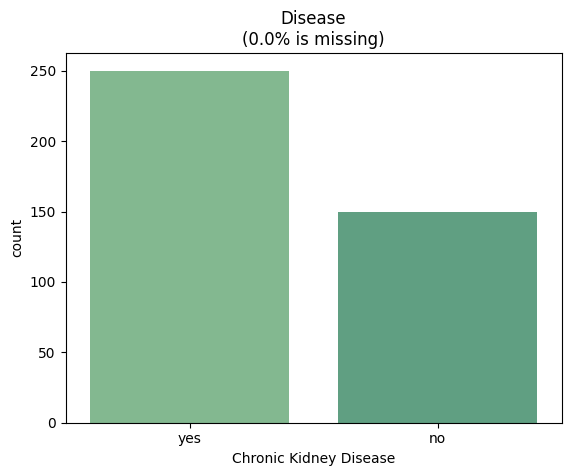

In [ ]:
missing_percentage = missing_categorical_values_count[-1]*100/400
column_label = col + "\n{}% of values missing".format(missing_percentage)
fig = sns.countplot(x='Chronic Kidney Disease', data=data,label=column_label, palette=sns.cubehelix_palette(rot=-.50,light=0.65,hue=1))
plt.title("Disease\n({}% is missing)".format(missing_percentage))
plt.show();

### Label encoding for categorical features

In [ ]:
#Label encoding
encoder = LabelEncoder()
for i in categorical:
  df[i] = encoder.fit_transform(df[i])
  for j in range(len(df[i])):
    if pd.isnull(data[i][j]) == True:
      df[i][j] = np.nan

In [ ]:
((pd.isna(data)==pd.isna(df))==False).sum()

Age (yrs)                         0
Blood Pressure (mm/Hg)            0
Specific Gravity                  0
Albumin                           0
Sugar                             0
Red Blood Cells                   0
Pus Cells                         0
Pus Cell Clumps                   0
Bacteria                          0
Blood Glucose Random (mgs/dL)     0
Blood Urea (mgs/dL)               0
Serum Creatinine (mgs/dL)         0
Sodium (mEq/L)                    0
Potassium (mEq/L)                 0
Hemoglobin (gms)                  0
Packed Cell Volume                0
White Blood Cells (cells/cmm)     0
Red Blood Cells (millions/cmm)    0
Hypertension                      0
Diabetes Mellitus                 0
Coronary Artery Disease           0
Appetite                          0
Pedal Edema                       0
Anemia                            0
Chronic Kidney Disease            0
dtype: int64

### Standardizing the data

In [ ]:
SS = StandardScaler()
pipe = make_pipeline(SS)
standard_data = pd.DataFrame(pipe.fit_transform(df),columns = feature_names)
cat_data = pd.DataFrame()
num_data = pd.DataFrame()
for i in categorical:
  cat_data = pd.concat([cat_data,standard_data[i]], axis=1)
for i in numerical:
  num_data = pd.concat([num_data,standard_data[i]], axis=1)

In [ ]:
cat_data.head()

,Red Blood Cells,Pus Cells,Pus Cell Clumps,Bacteria,Hypertension,Diabetes Mellitus,Coronary Artery Disease,Appetite,Pedal Edema,Anemia,Chronic Kidney Disease
0,NaN,0.541698,-0.344447,-0.242536,1.306707,1.380257,-0.305625,-0.508601,-0.485071,-0.420703,0.774597
1,NaN,0.541698,-0.344447,-0.242536,-0.765283,-0.724503,-0.305625,-0.508601,-0.485071,-0.420703,0.774597
2,0.483561,0.541698,-0.344447,-0.242536,-0.765283,1.380257,-0.305625,1.966177,-0.485071,2.376973,0.774597
3,0.483561,-1.846048,2.903200,-0.242536,1.306707,-0.724503,-0.305625,1.966177,2.061553,2.376973,0.774597
4,0.483561,0.541698,-0.344447,-0.242536,-0.765283,-0.724503,-0.305625,-0.508601,-0.485071,-0.420703,0.774597


### Distribution of numerical features after standardization

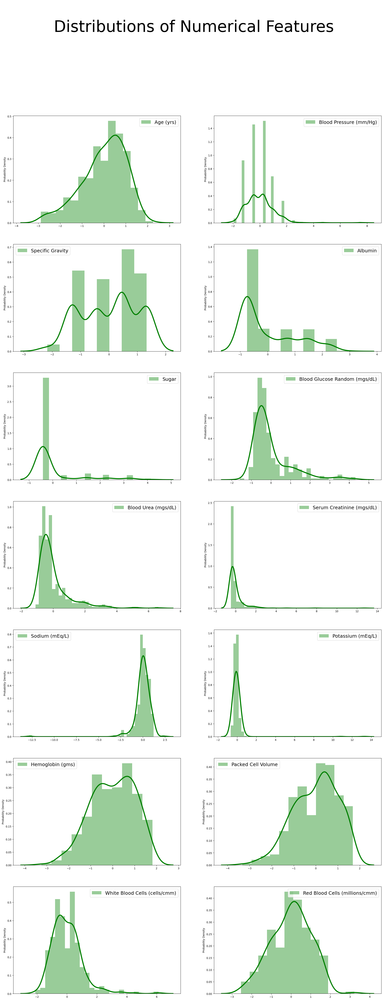

In [ ]:
n_col = 2
n_row = 7
figure, axes = plt.subplots(nrows=n_row, ncols=n_col, figsize=(25, 60))
figure.suptitle('\n Distributions of Numerical Features', fontsize=60)

k=0
for index, col in enumerate(numerical):
  i,j= index // n_col, index % n_col
  fig = sns.distplot(num_data[col], color="g", label=col, norm_hist=True, ax=axes[i,j], kde_kws={"lw":4})
  fig=fig.legend(loc='best', fontsize=18)
  axes[i,j].set_ylabel("Probability Density",fontsize='medium')
  axes[i,j].set_xlabel(None)
  k+=1
warnings.filterwarnings("ignore")
plt.show()

### Countplot of catergorical features after standardization

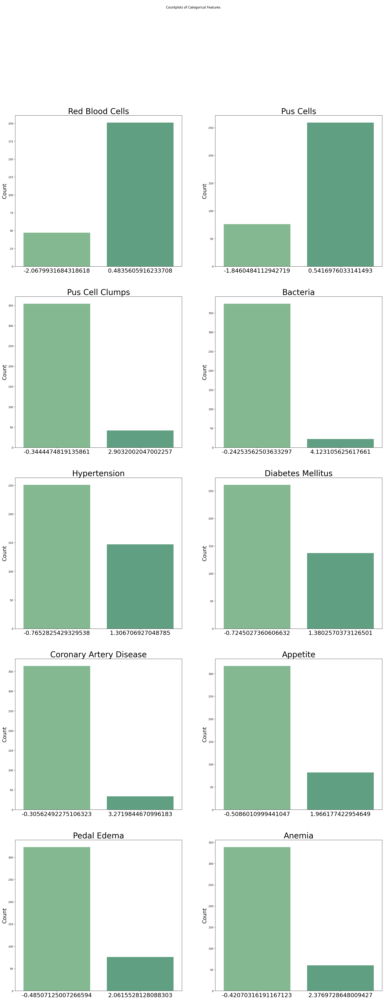

In [ ]:
n_col = 2
n_row = 5
figure, axes = plt.subplots(nrows=n_row, ncols=n_col, figsize=(25, 60))
figure.suptitle('\n Countplots of Categorical Features')
categoricals = categorical[:-1]

k=0
for index, col in enumerate(categoricals):
  i,j= index // n_col, index % n_col
  fig = sns.countplot(x=col, data=cat_data,label=col, palette=sns.cubehelix_palette(rot=-.50,light=0.65,hue=1),ax=axes[i,j])
  axes[i,j].set_title(col,fontsize=30)
  axes[i,j].set_xlabel(None)
  axes[i,j].set_ylabel("Count",fontsize=20)
  axes[i,j].set_xticklabels(axes[i,j].get_xticklabels(), fontsize=22)
  k+=1
warnings.filterwarnings("ignore")
plt.show()

### Imputation

In [ ]:
knn =KNNImputer(weights='distance', n_neighbors=8)
imputed_data = pd.DataFrame(knn.fit_transform(df), columns=feature_names)
imputed_cat_data = pd.DataFrame(knn.fit_transform(cat_data), columns=categorical)
imputed_num_data = pd.DataFrame(knn.fit_transform(num_data), columns=numerical)
imputed_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 25 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Age (yrs)                       400 non-null    float64
 1   Blood Pressure (mm/Hg)          400 non-null    float64
 2   Specific Gravity                400 non-null    float64
 3   Albumin                         400 non-null    float64
 4   Sugar                           400 non-null    float64
 5   Red Blood Cells                 400 non-null    float64
 6   Pus Cells                       400 non-null    float64
 7   Pus Cell Clumps                 400 non-null    float64
 8   Bacteria                        400 non-null    float64
 9   Blood Glucose Random (mgs/dL)   400 non-null    float64
 10  Blood Urea (mgs/dL)             400 non-null    float64
 11  Serum Creatinine (mgs/dL)       400 non-null    float64
 12  Sodium (mEq/L)                  400 

In [ ]:
for i in cat_data:
  l = list(cat_data[i].dropna().unique())
  for j in range(len(cat_data[i])):
    a = [(x-float(imputed_cat_data[i][j]))**2 for x in l]
    e = a.index(min(a))
    imputed_cat_data[i][j] = l[e]
    imputed_data[i][j] = l[e]
imputed_cat_data

,Red Blood Cells,Pus Cells,Pus Cell Clumps,Bacteria,Hypertension,Diabetes Mellitus,Coronary Artery Disease,Appetite,Pedal Edema,Anemia,Chronic Kidney Disease
0,0.483561,0.541698,-0.344447,-0.242536,1.306707,1.380257,-0.305625,-0.508601,-0.485071,-0.420703,0.774597
1,0.483561,0.541698,-0.344447,-0.242536,-0.765283,-0.724503,-0.305625,-0.508601,-0.485071,-0.420703,0.774597
2,0.483561,0.541698,-0.344447,-0.242536,-0.765283,1.380257,-0.305625,1.966177,-0.485071,2.376973,0.774597
3,0.483561,-1.846048,2.903200,-0.242536,1.306707,-0.724503,-0.305625,1.966177,2.061553,2.376973,0.774597
4,0.483561,0.541698,-0.344447,-0.242536,-0.765283,-0.724503,-0.305625,-0.508601,-0.485071,-0.420703,0.774597
...,...,...,...,...,...,...,...,...,...,...,...
395,0.483561,0.541698,-0.344447,-0.242536,-0.765283,-0.724503,-0.305625,-0.508601,-0.485071,-0.420703,-1.290994
396,0.483561,0.541698,-0.344447,-0.242536,-0.765283,-0.724503,-0.305625,-0.508601,-0.485071,-0.420703,-1.290994
397,0.483561,0.541698,-0.344447,-0.242536,-0.765283,-0.724503,-0.305625,-0.508601,-0.485071,-0.420703,-1.290994
398,0.483561,0.541698,-0.344447,-0.242536,-0.765283,-0.724503,-0.305625,-0.508601,-0.485071,-0.420703,-1.290994


In [ ]:
check_for_num_missing_values = []
check_for_cat_missing_values = []
for i in (numerical):
  check_for_num_missing_values.append(imputed_data[i].isnull().sum())
for i in (categorical):
  check_for_cat_missing_values.append(imputed_data[i].isnull().sum())

### Distribution of numerical features after imputation

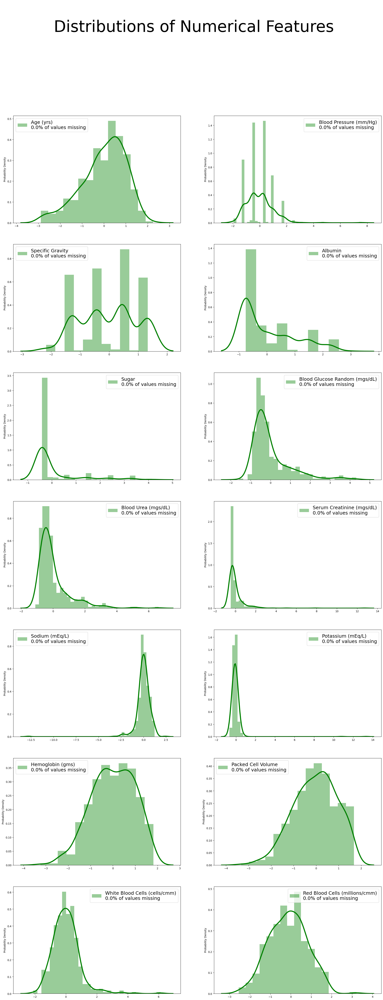

In [ ]:
n_col = 2
n_row = 7
figure, axes = plt.subplots(nrows=n_row, ncols=n_col, figsize=(25, 60))
figure.suptitle('\n Distributions of Numerical Features', fontsize=60)

k=0
for index, col in enumerate(numerical):
  i,j= index // n_col, index % n_col
  missing_percentage = check_for_num_missing_values[k]*100/400
  column_label = col + "\n{}% of values missing".format(missing_percentage)
  fig = sns.distplot(imputed_num_data[col], color="g", label=column_label, norm_hist=True, ax=axes[i,j], kde_kws={"lw":4})
  fig=fig.legend(loc='best', fontsize=18)
  axes[i,j].set_ylabel("Probability Density",fontsize='medium')
  axes[i,j].set_xlabel(None)
  k+=1
warnings.filterwarnings("ignore")
plt.show()

### Countplots of categorical features after imputation

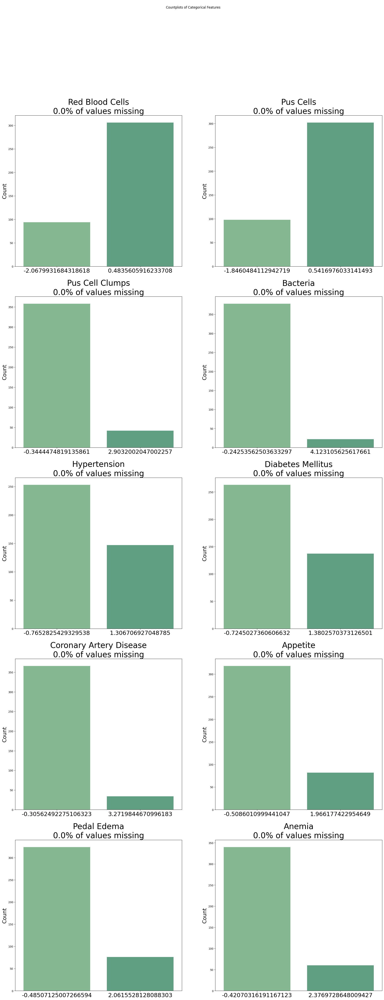

In [ ]:
n_col = 2
n_row = 5
figure, axes = plt.subplots(nrows=n_row, ncols=n_col, figsize=(25, 60))
figure.suptitle('\n Countplots of Categorical Features')
categoricals = categorical[:-1]

k=0
for index, col in enumerate(categoricals):
  i,j= index // n_col, index % n_col
  missing_percentage = check_for_cat_missing_values[k]*100/400
  column_label = col + "\n{}% of values missing".format(missing_percentage)
  fig = sns.countplot(x=col, data=imputed_cat_data,label=column_label, palette=sns.cubehelix_palette(rot=-.50,light=0.65,hue=1),ax=axes[i,j])
  axes[i,j].set_title(column_label,fontsize=30)
  axes[i,j].set_xlabel(None)
  axes[i,j].set_ylabel("Count",fontsize=20)
  axes[i,j].set_xticklabels(axes[i,j].get_xticklabels(), fontsize=22)
  k+=1
warnings.filterwarnings("ignore")
plt.show()

### Crosstabs of categorical variables to assess the relationship between variables

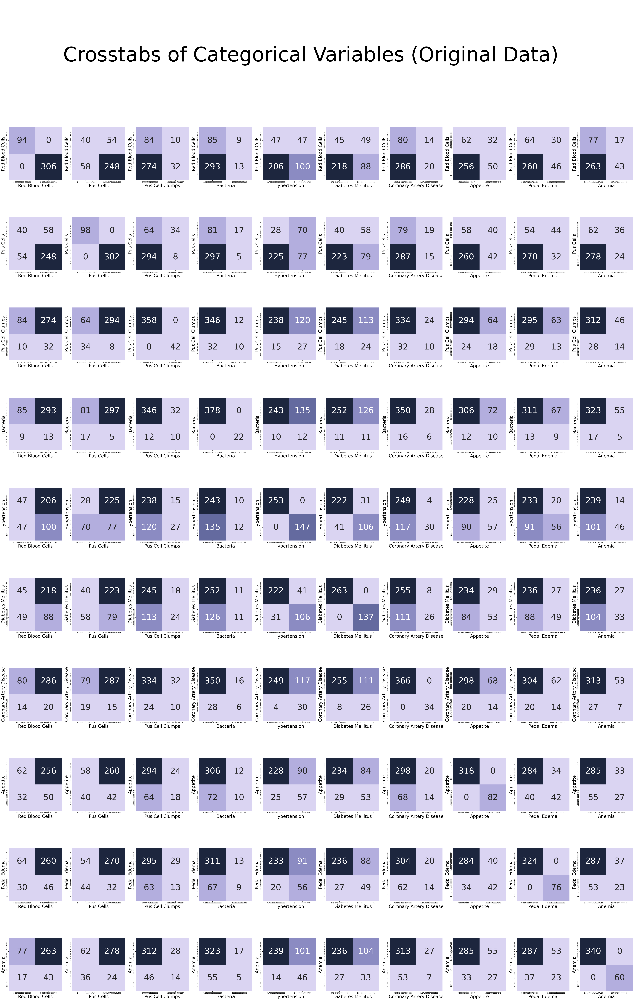

In [ ]:
n_rows, n_cols = (10,10)

figure, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(70, 100))
figure.suptitle('\n\nCrosstabs of Categorical Variables (Original Data)\n', fontsize=125)

for i in range(10):
    for j in range(10):
        sns.heatmap(pd.crosstab(imputed_cat_data.iloc[:,i],imputed_cat_data.iloc[:,j]),
                    ax=axes[i,j],
                    cmap=sns.cubehelix_palette(start=2.8, rot=.1),
                    square='True',
                    cbar=False,
                    annot=True,
                    annot_kws={'fontsize':52},
                    fmt='d')

        axes[i,j].set_xlabel(axes[i,j].get_xlabel(),fontsize=28)

        axes[i,j].set_ylabel(axes[i,j].get_ylabel(),fontsize=28)

### Boxplots and distributions of numerical features

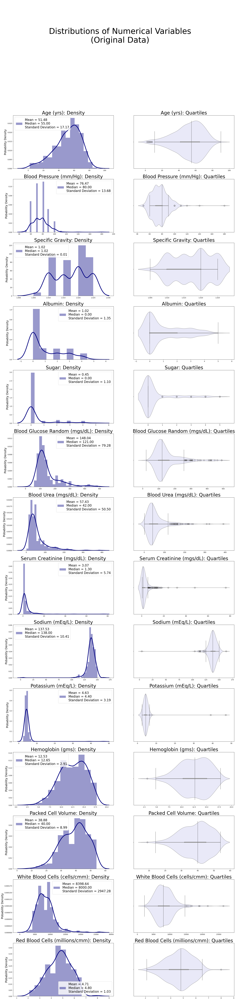

In [ ]:
n_rows, n_cols = (14,2)

figure, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(25, 100))
figure.suptitle('\n\n\nDistributions of Numerical Variables\n(Original Data)', fontsize=50)

for i in range(len(numerical)):
    col=numerical[i]

    label='Mean = {}\nMedian = {}\nStandard Deviation = {}'.format("%.2f"%data[col].mean(),
                                                                    "%.2f"%data[col].median(),
                                                                    "%.2f"%data[col].std())

    graph1=sns.distplot(data[col],
                        color="navy",
                        ax=axes[i,0],
                        kde_kws={"lw":4},
                        norm_hist=True,
                        label=label).legend(loc='best',fontsize=20)
    axes[i,0].set_title(col+': Density',fontsize=30)
    axes[i,0].set_xlabel(None)
    axes[i,0].set_ylabel("Pobability Density",fontsize=18)

    graph20=sns.violinplot(x=col,
                          data=data,
                          ax=axes[i,1],
                          color='lavender',
                          inner='box')
    graph21=sns.boxplot(x=col,
                        data=data,
                        ax=axes[i,1],
                        fliersize=8,
                        boxprops=dict(alpha=0))

    axes[i,1].set_xlabel(None)
    axes[i,1].set_title(col+': Quartiles',fontsize=30)


plt.show()

### Pearsons correlation matrix for checking multicollinearity.
Variance inflation factor is also calculated.

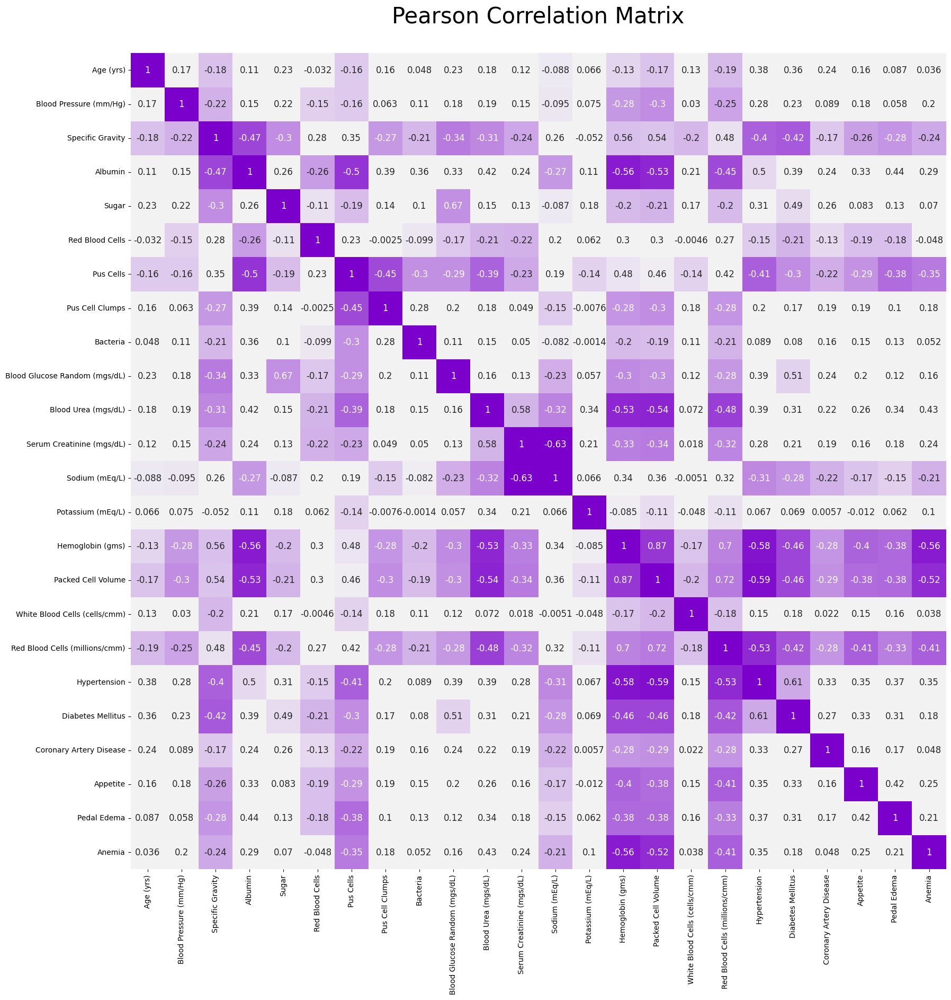

                           feature       V.I.F
0                        Age (yrs)   13.198779
1           Blood Pressure (mm/Hg)   39.351155
2                 Specific Gravity  587.182136
3                          Albumin    3.599832
4                            Sugar    2.678450
5                  Red Blood Cells    1.305366
6                        Pus Cells    1.863450
7                  Pus Cell Clumps    1.520227
8                         Bacteria    1.264029
9    Blood Glucose Random (mgs/dL)   10.649807
10             Blood Urea (mgs/dL)    5.585252
11       Serum Creatinine (mgs/dL)    3.166241
12                  Sodium (mEq/L)  449.504958
13               Potassium (mEq/L)    4.784447
14                Hemoglobin (gms)  110.307939
15              Packed Cell Volume  114.267400
16   White Blood Cells (cells/cmm)   13.700421
17  Red Blood Cells (millions/cmm)   70.438517
18                    Hypertension    2.469229
19               Diabetes Mellitus    2.196400
20         Co

In [ ]:
numericdat=imputed_data.drop('Chronic Kidney Disease', axis=1)

plt.figure(figsize=(20,20))

sns.heatmap(numericdat.corr("pearson"),
            cmap=sns.diverging_palette(280, 280, s=100, l=35, as_cmap=True,sep=80),
            square=True,
            annot=True,
            annot_kws={'fontsize':12},
            cbar=False)
plt.title("Pearson Correlation Matrix\n",fontsize=30)
plt.show()

vif = pd.DataFrame()
vif["feature"] = numericdat.columns
vif['V.I.F'] = [variance_inflation_factor(numericdat.values,i) for i in range(len(numericdat.columns))]
print(vif)

Experimenting for the best n_clusters for KMeans

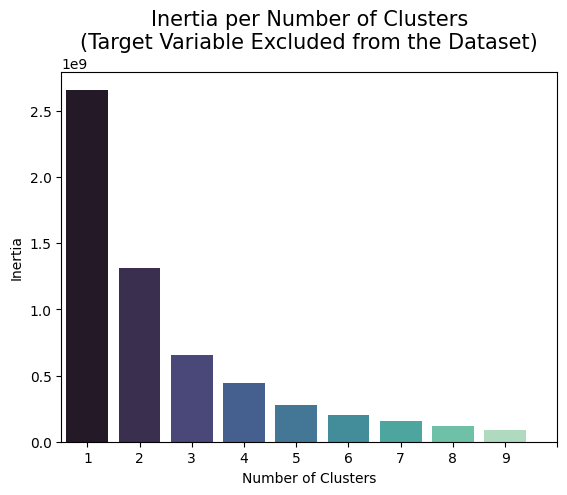

In [ ]:
for i in categorical:
  a = min(imputed_data[i])
  for j in range(400):
    if imputed_data[i][j] == a:
      imputed_data[i][j] = 0
    else:
      imputed_data[i][j] = 1
X = imputed_data.drop('Chronic Kidney Disease', axis=1, inplace=False)
Y = imputed_data['Chronic Kidney Disease']
inertia = []
for k in range(1,10):
  kc = KMeans(n_clusters=k)
  kc.fit(X)
  inertia.append(kc.inertia_)

inertia_df = pd.DataFrame(zip(list(range(1,10)),inertia))
sns.barplot(x=list(range(1,10)), y=inertia, data=inertia_df, palette='mako')
plt.xlabel('Number of Clusters',fontsize=10)
plt.ylabel('Inertia',fontsize=10)
plt.xticks(list(range(0,10)))
plt.title("Inertia per Number of Clusters\n(Target Variable Excluded from the Dataset)",fontsize=15)
plt.show()

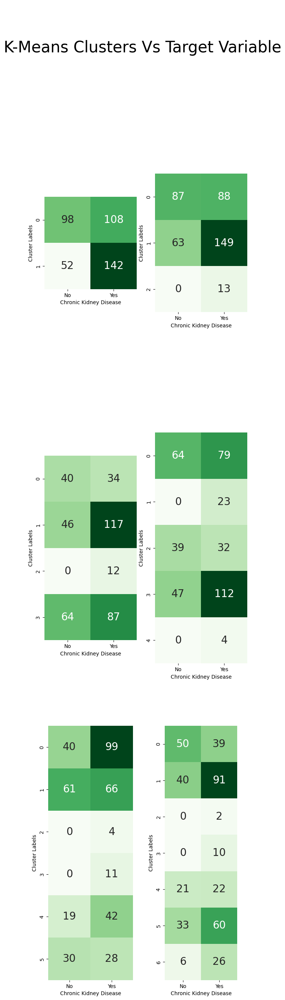

In [ ]:
n_rows, n_cols = (3,2)

figure, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(7, 30))
figure.suptitle('\n\nK-Means Clusters Vs Target Variable', fontsize=30)

for index in range(6):

    i,j = (index // n_cols), (index % n_cols)

    model=KMeans(n_clusters=index+2)

    model.fit(X)

    cluster_labels=model.predict(X)

    sns.heatmap(pd.crosstab(cluster_labels,Y),
                ax=axes[i,j],
                cmap='Greens',
                square='True',
                cbar=False,
                annot=True,
                annot_kws={'fontsize':20},
                fmt='d')

    axes[i,j].set_xlabel("Chronic Kidney Disease",fontsize=10)

    axes[i,j].set_ylabel("Cluster Labels",fontsize=10)

    axes[i,j].set_yticklabels(axes[i,j].get_yticklabels(),fontsize=10)

    axes[i,j].set_xticklabels(["No","Yes"],fontsize=10)
plt.show()

Incorporating Principle component analysis along with KMeans for reducing the dimensionality of the dataset.


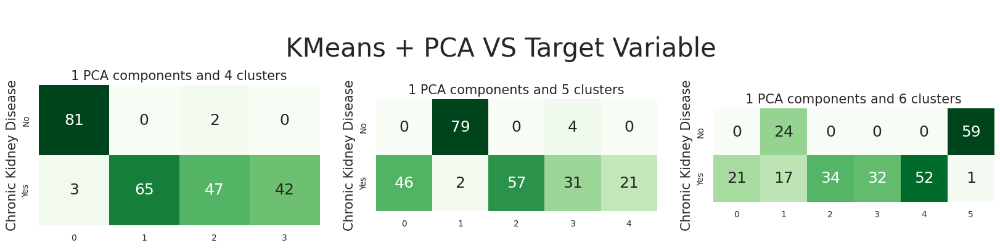

In [ ]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.4, random_state=12)
ncol, nrow = 3,1
figure, axes = plt.subplots(nrows = nrow, ncols=ncol, figsize=(20,5))
figure.suptitle("\n KMeans + PCA VS Target Variable \n", fontsize =30)
for index in range(3):
  i,j = (index // ncol), (index % ncol)
  pca = PCA(n_components = 1)
  kc = KMeans(n_clusters = j+4, random_state=5)
  pca_data = pca.fit_transform(X_train)
  kc.fit(pca_data)
  cluster_labels = kc.predict(pca_data)
  sns.heatmap(pd.crosstab(Y_train,cluster_labels),
              ax=axes[j],
              cmap='Greens',
              square='True',
              cbar=False,
              annot=True,
              annot_kws={'fontsize':18},
              fmt='d')

  axes[j].set_title("{} PCA components and {} clusters".format(i+1,j+4),fontsize=15)
  axes[j].set_ylabel("Chronic Kidney Disease",fontsize=15)
  axes[j].set_xlabel(None)
  axes[j].set_xticklabels(axes[j].get_xticklabels(),fontsize=10)
  axes[j].set_yticklabels(["No","Yes"],fontsize=10)

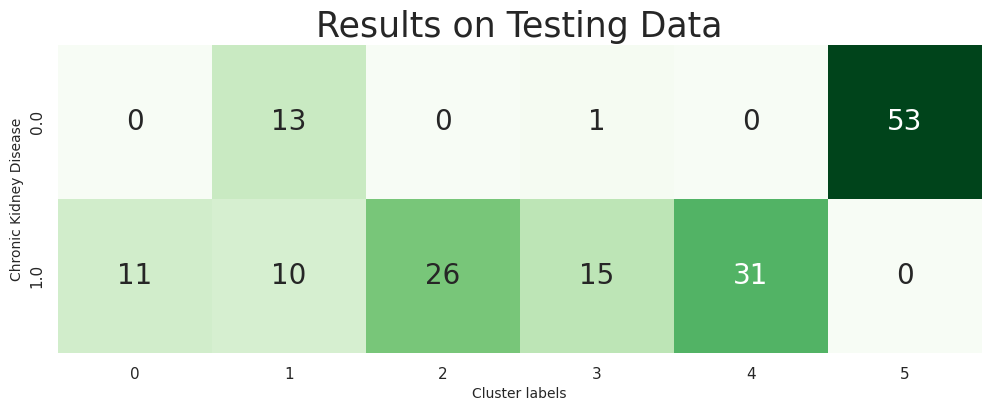

In [ ]:
pca = PCA(n_components=1)

pca_training_data=pca.fit_transform(X_train)

model=KMeans(n_clusters=6, random_state=5)

model.fit(pca_training_data)

pca_testing_data=pca.transform(X_test)

cluster_labels=model.predict(pca_testing_data)

sns.heatmap(pd.crosstab(Y_test,cluster_labels),
                cmap='Greens',
                square='True',
                cbar=False,
                annot=True,
                annot_kws={'fontsize':20},
                fmt='d')

plt.title("Results on Testing Data",fontsize=25)
plt.ylabel("Chronic Kidney Disease",fontsize=10)
plt.xlabel("Cluster labels",fontsize=10)
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

## Random Forest classifier model


 Accuracy score: 
 0.985

 Classification Report: 
               precision    recall  f1-score   support

         0.0       0.97      0.99      0.98       148
         1.0       0.99      0.98      0.99       252

    accuracy                           0.98       400
   macro avg       0.98      0.99      0.98       400
weighted avg       0.99      0.98      0.99       400



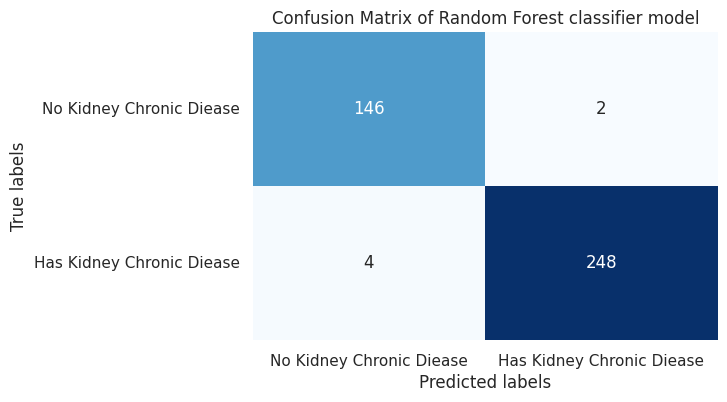

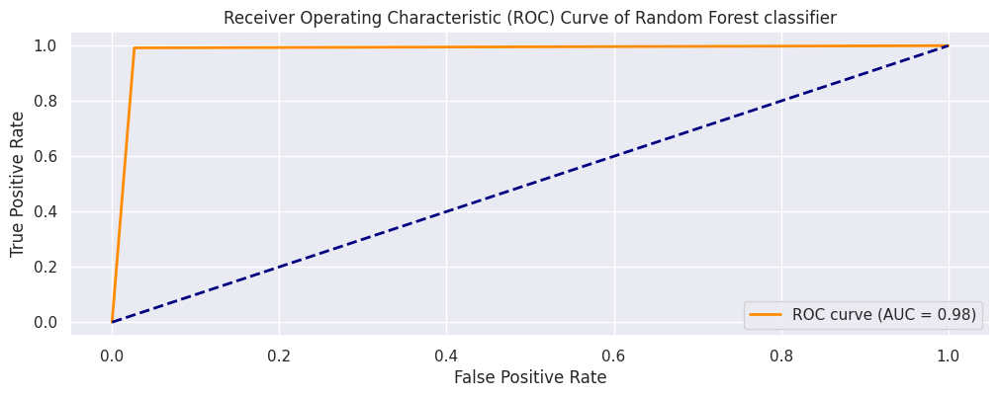

AUC Score: 0.98


In [ ]:
Forest=RandomForestClassifier()
pca_model = PCA(n_components=6)
pipe = make_pipeline(pca_model, Forest)
pipe.fit(X_train, Y_train)
predicted = pipe.predict(X)
print("\n Accuracy score: \n", accuracy_score(predicted, Y))
print("\n Classification Report: \n",classification_report(predicted, Y))

plt.figure(figsize=(6, 4))
labelss = ["No Kidney Chronic Diease", "Has Kidney Chronic Diease"]
sns.heatmap(confusion_matrix(predicted, Y), annot=True, cmap="Blues", fmt="d", cbar=False, xticklabels = labelss, yticklabels = labelss)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix of Random Forest classifier model')
plt.xticks(rotation=0)
plt.show()

fpr, tpr, thresholds = roc_curve(Y, predicted)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve of Random Forest classifier')
plt.legend(loc='lower right')
plt.show()

print(f'AUC Score: {roc_auc:.2f}')

### Data preparation for Bayesian Hierarchical model

In [ ]:
x = data.drop(columns=['Chronic Kidney Disease'], inplace=False)
y = data['Chronic Kidney Disease']
cate_data = pd.DataFrame()
nume_data = pd.DataFrame()
for i in categorical:
  cate_data = pd.concat([cate_data,df[i]], axis=1)
for i in numerical:
  nume_data = pd.concat([nume_data,df[i]], axis=1)
not_imputed_data = pd.DataFrame(knn.fit_transform(df), columns=feature_names)
not_imputed_cat_data = pd.DataFrame(knn.fit_transform(cate_data), columns=categorical)
not_imputed_num_data = pd.DataFrame(knn.fit_transform(nume_data), columns=numerical)

for i in categorical:
  for j in range(len(not_imputed_cat_data[i])):
    if not_imputed_cat_data[i][j]>=0.5:
      not_imputed_cat_data[i][j] = 1
    else:
      not_imputed_cat_data[i][j] = 0
not_imputed_cat_data

,Red Blood Cells,Pus Cells,Pus Cell Clumps,Bacteria,Hypertension,Diabetes Mellitus,Coronary Artery Disease,Appetite,Pedal Edema,Anemia,Chronic Kidney Disease
0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0
1,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0
3,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0
4,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...
395,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
396,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
397,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
398,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
for i in numerical:
  for j in range(len(not_imputed_num_data[i])):
    if not_imputed_num_data[i][j]<=0:
      not_imputed_num_data[i][j] = 1e-9

In [ ]:
not_imputed_num_data = not_imputed_num_data.apply(lambda x: stats.boxcox(x)[0])
now_imputed_num_data = pd.DataFrame(SS.fit_transform(not_imputed_num_data), columns=numerical)
now_imputed_num_data

,Age (yrs),Blood Pressure (mm/Hg),Specific Gravity,Albumin,Sugar,Blood Glucose Random (mgs/dL),Blood Urea (mgs/dL),Serum Creatinine (mgs/dL),Sodium (mEq/L),Potassium (mEq/L),Hemoglobin (gms),Packed Cell Volume,White Blood Cells (cells/cmm),Red Blood Cells (millions/cmm)
0,-0.264292,0.421522,0.493587,0.955637,-0.554071,-0.179881,-0.301074,-0.306074,0.013154,-0.046184,1.038983,0.578211,-0.164994,0.545526
1,-2.143838,-2.798984,0.493587,1.081036,-0.554071,-0.339568,-1.333873,-0.927894,-0.167723,-0.746171,-0.522480,-0.183101,-1.028746,0.598583
2,0.616820,0.421522,-1.309089,1.018409,1.816940,2.334100,0.253326,0.214972,-0.743643,0.045594,-1.087786,-0.976901,-0.296786,-0.413501
3,-0.264292,-0.389571,-2.153187,1.081036,-0.554071,-0.266549,0.331008,0.964125,-3.014464,-4.189113,-0.557137,-0.869970,-0.670543,-0.905603
4,-0.083548,0.421522,-1.309089,1.018409,-0.554071,-0.528030,-0.779578,-0.097057,0.142228,-0.308614,-0.417485,-0.536106,-0.387057,-0.141217
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
395,0.164459,0.421522,0.493587,-0.989457,-0.554071,0.182772,0.142083,-1.800680,2.180451,0.700357,1.163484,0.985587,-0.670543,0.198687
396,-0.611536,-0.389571,1.455181,-0.989457,-0.554071,-1.531313,-0.519562,-0.306074,0.448797,-1.292150,1.501968,2.002623,-0.164994,1.748441
397,-1.993733,0.421522,0.493587,-0.989457,-0.554071,-0.687324,-0.779578,-1.440731,-0.200242,0.142093,1.205281,1.266784,-0.719788,0.780470
398,-1.814140,-1.424062,1.455181,-0.989457,-0.554071,-0.334330,0.170783,-0.572127,-0.499507,0.700357,0.554528,1.555541,-0.432952,1.380309


### Cramer'v and chi-square test for binary categorical features

<Axes: >

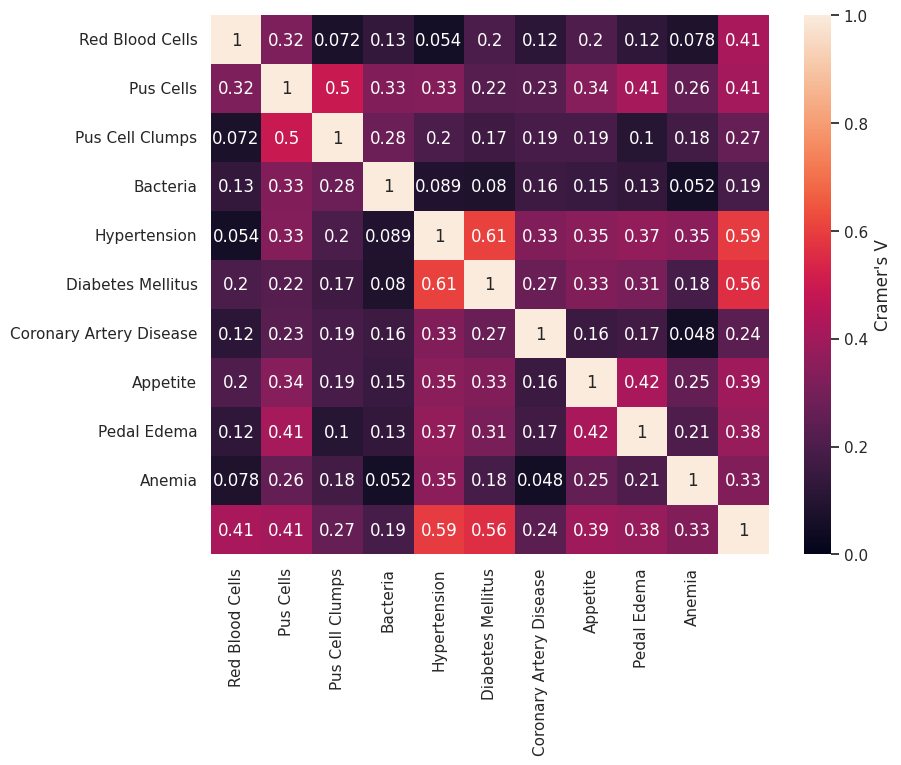

In [ ]:
def cramers_v(x, y):
    conf_matrix = pd.crosstab(x, y)
    # Compute chi-squared w/o Yates' continuity correction
    chi2 = stats.chi2_contingency(conf_matrix, correction=False)[0]
    n = sum(conf_matrix.sum())
    # With binary variables we have V = np.sqrt(chi2 / n)
    return np.sqrt(chi2 / n)

corr_bin = np.eye(not_imputed_cat_data.shape[1])
for r in range(not_imputed_cat_data.shape[1]):
    for c in range(not_imputed_cat_data.shape[1]):
        corr_bin[r,c] = cramers_v(not_imputed_cat_data.iloc[:,r], not_imputed_cat_data.iloc[:,c])

# Plot correlation matrix
sns.set(rc={'figure.figsize':(9, 7)})
sns.heatmap(corr_bin, vmin=0, vmax=1, annot=True,
            cbar_kws={'label': "Cramer's V"},
            xticklabels=categorical[:-1], yticklabels=categorical[:-1])

In [ ]:
import scipy.stats as stats
data_np = np.array(not_imputed_cat_data)
X2 = stats.chi2_contingency(data_np, correction=False)[0]
n = np.sum(data_np)
minDim = min(data_np.shape)-1
V = np.sqrt((X2/n) / minDim)
print("Cramer's V:",V)
for i in categorical:
  print("\n",pd.crosstab(not_imputed_cat_data.loc[:,i],not_imputed_cat_data.loc[:,'Chronic Kidney Disease']))

Cramer's V: 0.38446602426303883

 Chronic Kidney Disease  0.0  1.0
Red Blood Cells                 
0.0                       0   89
1.0                     150  161

 Chronic Kidney Disease  0.0  1.0
Pus Cells                       
0.0                       0   86
1.0                     150  164

 Chronic Kidney Disease  0.0  1.0
Pus Cell Clumps                 
0.0                     150  208
1.0                       0   42

 Chronic Kidney Disease  0.0  1.0
Bacteria                        
0.0                     150  228
1.0                       0   22

 Chronic Kidney Disease  0.0  1.0
Hypertension                    
0.0                     150  103
1.0                       0  147

 Chronic Kidney Disease  0.0  1.0
Diabetes Mellitus               
0.0                     150  113
1.0                       0  137

 Chronic Kidney Disease   0.0  1.0
Coronary Artery Disease          
0.0                      150  216
1.0                        0   34

 Chronic Kidney Disease  

### Pairplot for checking the relationship between numerical features

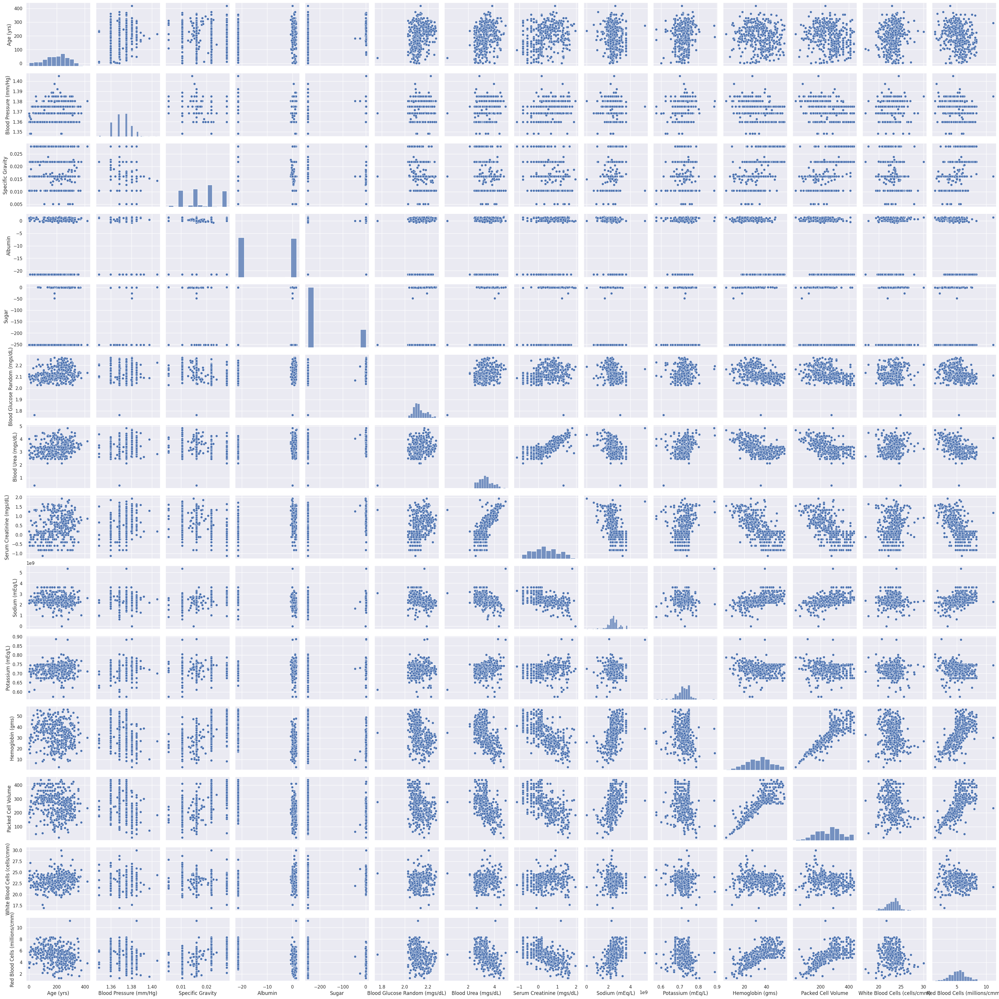

In [ ]:
sns.pairplot(data=not_imputed_num_data)

### PCA Visualization

Text(0, 0.5, 'PC2 (0.00%)')

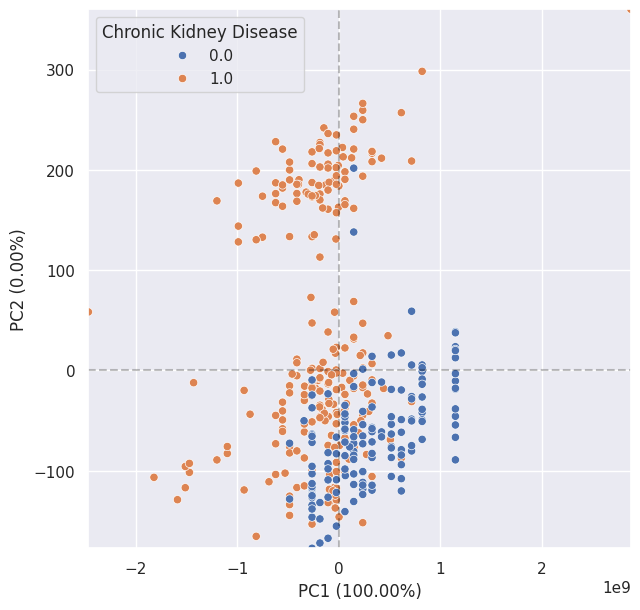

In [ ]:
pca_model = PCA(n_components=2).fit(not_imputed_num_data)
explained_var = pca_model.explained_variance_ratio_*100
scores = pd.DataFrame(pca_model.transform(not_imputed_num_data), columns=['PC1','PC2'])
scores['Chronic Kidney Disease'] = not_imputed_cat_data['Chronic Kidney Disease']

sns.set(rc={'figure.figsize':(7, 7)})
sns.scatterplot(x='PC1', y='PC2', data=scores, hue ='Chronic Kidney Disease' )

plt.xlim(min(scores['PC1']), max(scores['PC1']))
plt.ylim(min(scores['PC2']), max(scores['PC2']))
plt.axhline(0, linestyle='--', color='black', alpha=.25)
plt.axvline(0, linestyle='--', color='black', alpha=.25)
plt.xlabel('PC1 ({exp_var:.2f}%)'.format(exp_var=explained_var[0]))
plt.ylabel('PC2 ({exp_var:.2f}%)'.format(exp_var=explained_var[1]))

### Bayesian Hierarchical model construction

In [ ]:
X_bin = np.array(not_imputed_cat_data)
Y = np.array(not_imputed_cat_data['Chronic Kidney Disease'])
X_quant = np.array(now_imputed_num_data)
NUM_SAMPLES, NUM_VAR = data.shape

X = np.concatenate([np.ones((NUM_SAMPLES, 1)), X_bin, X_quant], axis=1)

with pm.Model() as model:
    # Intercept and coefficients
    beta = pm.Normal('beta', mu=0, sigma=5, shape=X.shape[1])
    logit = pm.math.dot(X, beta)
    # Logistic link
    p = 1 / (1 + np.exp(-logit))
    # Return loglik of Y
    obs = pm.Bernoulli('obs', p, observed=Y)

### Sampling & visualiazing beta(prior distribution)

array([[<Axes: title={'center': 'beta'}>,
        <Axes: title={'center': 'beta'}>]], dtype=object)

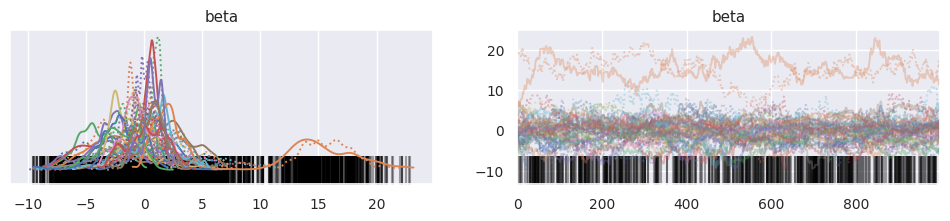

In [ ]:
SEED = 999
np.random.seed(SEED)

with model:
    start = pm.find_MAP()
    opt = pm.HamiltonianMC(beta)
    trace = pm.sample(1000, step=opt, start=start, return_inferencedata=True, random_seed=SEED)

pm.plot_trace(trace)

### Visualizing the posteriors for different features.

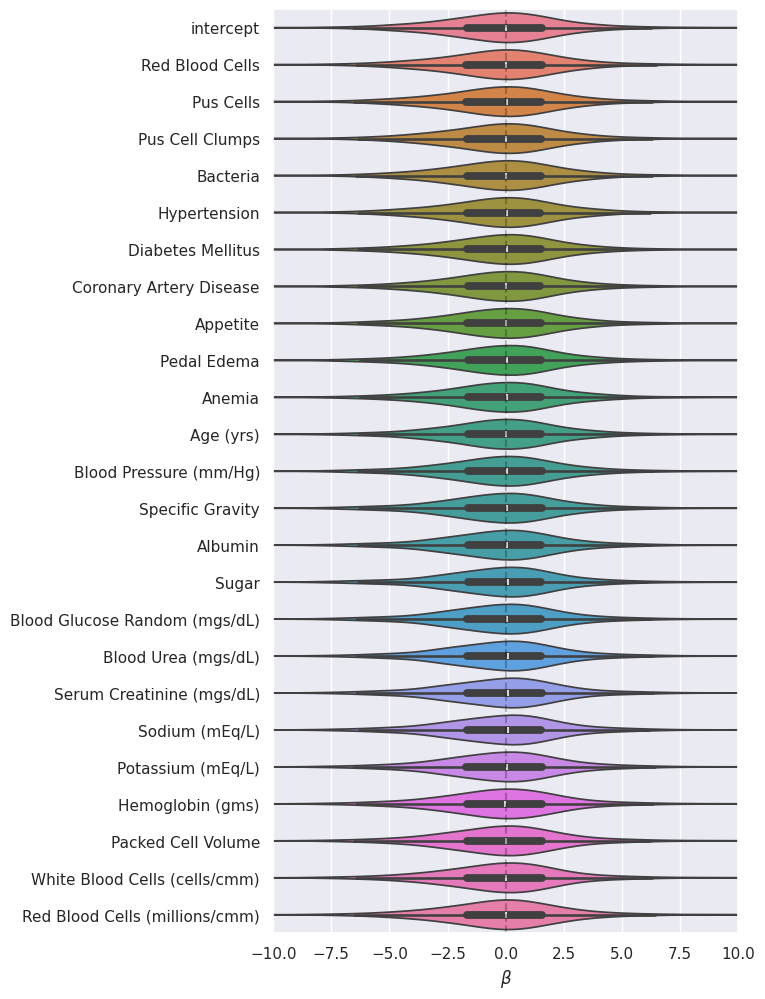

In [ ]:
trace_beta = trace.posterior['beta'].values.reshape(-1, NUM_VAR)
beta_names = ['intercept'] + categorical[:-1] + numerical + ['Chronic Kidney Disease']

# Violin plot with seaborn
sns.set(rc={'figure.figsize':(6, 12)})
ax = sns.violinplot(data=trace_beta, orient='h')
ax.set(xlabel=r'$\beta$')
ax.set_yticklabels(beta_names)
ax.set_xlim(-10,10)
plt.axvline(0., linestyle='--', color='black', alpha=.25)

### Predictions

Text(0, 0.5, 'Frequency')

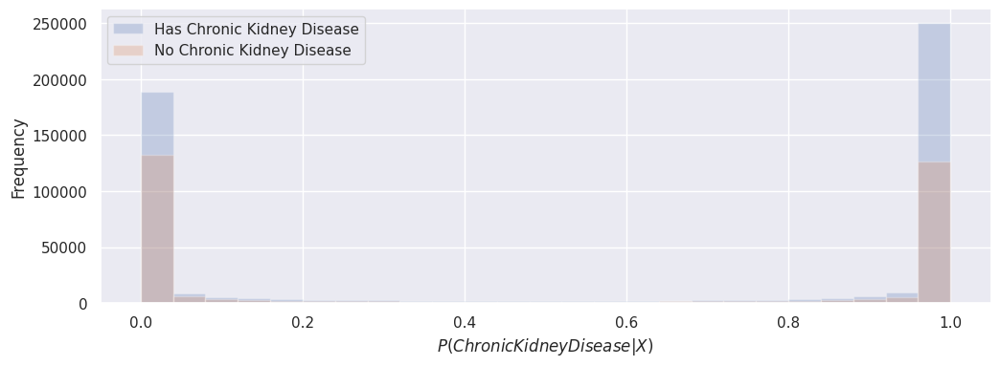

In [ ]:
X1  = np.concatenate([X_bin, X_quant], axis=1)

# Compute logit and probabilities from the posterior samples
post_logit = np.matmul(X1, trace_beta.T)
post_p = 1 / (1 + np.exp(-post_logit))

# Plot
sns.set(rc={'figure.figsize':(12, 4)})
plt.hist(post_p[Y == 1,:].flatten(), alpha=.25, label='Has Chronic Kidney Disease', bins=25)
plt.hist(post_p[Y == 0,:].flatten(), alpha=.25, label='No Chronic Kidney Disease', bins=25)
plt.legend()
plt.xlabel(r'$P(Chronic Kidney Disease|X)$')
plt.ylabel('Frequency')

### Accuracy, sensitivity and specificity of Bayesian Hierarchical model


 Accuracy score: 
 0.7925

 Classification Report: 
               precision    recall  f1-score   support

       False       0.65      0.76      0.70       129
        True       0.88      0.81      0.84       271

    accuracy                           0.79       400
   macro avg       0.76      0.78      0.77       400
weighted avg       0.80      0.79      0.80       400



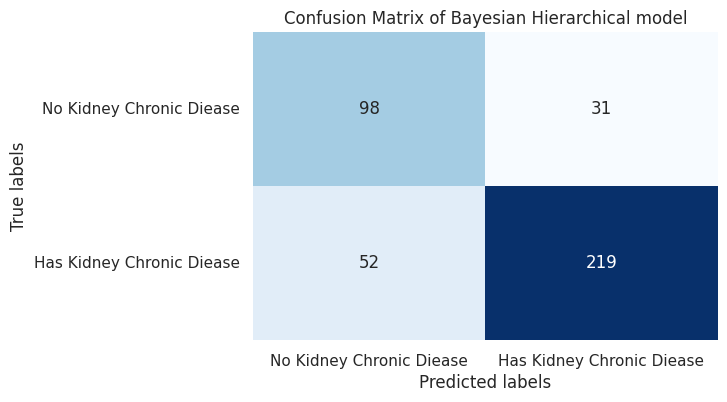

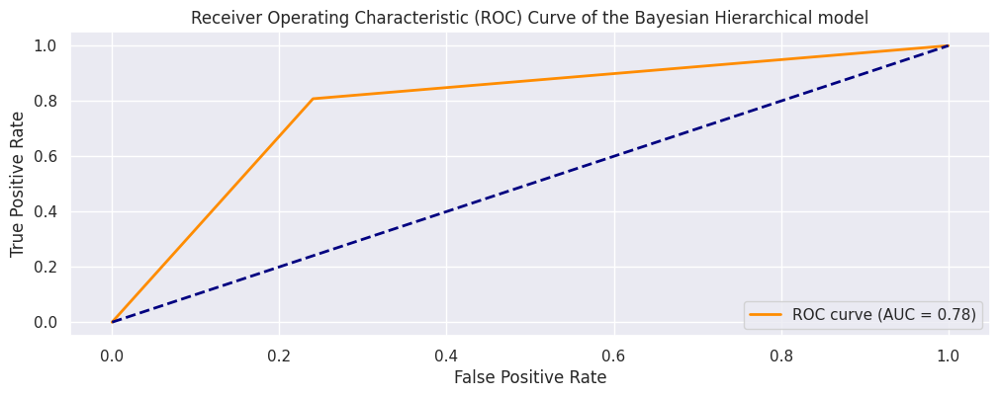


 AUC Score of the Meta Learner: 0.78


In [ ]:
# Flag observation w/ posterior prob > .01 that P(Death) > 0.5
acc, sens, spec = [], [], []

pred = np.mean(post_p > .5, axis=1) > 0.5
tn, fp, fn, tp = confusion_matrix(Y, pred.astype(np.int16)).ravel()
acc.append((tp + tn) / (tn + fp + fn + tp))
sens.append(tp / (tp + fn))
spec.append(tn / (tn + fp))

results = {'cutoff':0.5, 'accuracy': acc, 'sensitivity': sens, 'specificity': spec}
results_df = pd.DataFrame(results)
print("\n Accuracy score: \n", accuracy_score(pred, Y))
print("\n Classification Report: \n",classification_report(pred, Y))

# Confusion Matrix
plt.figure(figsize=(6, 4))
labelss = ["No Kidney Chronic Diease", "Has Kidney Chronic Diease"]
sns.heatmap(confusion_matrix(pred, Y), annot=True, cmap="Blues", fmt="d", cbar=False, xticklabels = labelss, yticklabels = labelss)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix of Bayesian Hierarchical model')
plt.xticks(rotation=0)
plt.show()

# Compute ROC curve and AUC score
fpr, tpr, thresholds = roc_curve(pred, Y)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve of the Bayesian Hierarchical model')
plt.legend(loc='lower right')
plt.show()

print(f'\n AUC Score of the Meta Learner: {roc_auc:.2f}')

### Meta-learner to combine(fusion) of both RandomForest and Bayesian Hierarchical model.
Here the meta learner combines the both predictions of the above stated model and uses those predictions to predict the final category.Her meta learner is taken as Logistic Regression.


 Accuracy score: 
 0.8

 Classification Report: 
               precision    recall  f1-score   support

         0.0       0.57      0.80      0.67        20
         1.0       0.92      0.80      0.86        60

    accuracy                           0.80        80
   macro avg       0.75      0.80      0.76        80
weighted avg       0.84      0.80      0.81        80



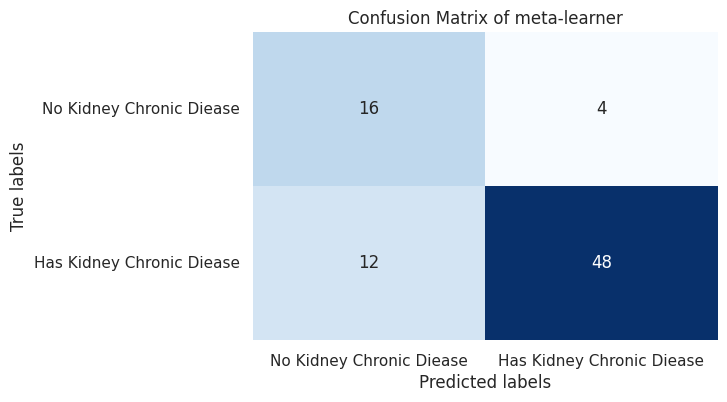

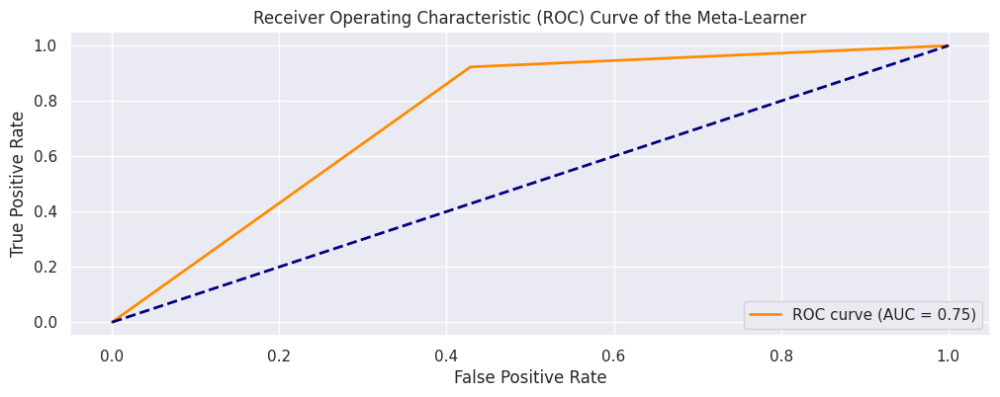

AUC Score of the Meta Learner: 0.75


In [ ]:
prediction_from_bayesian = pred.astype(np.int16)

from sklearn.linear_model import LogisticRegression
stacked_predictions = pd.DataFrame(prediction_from_bayesian,predicted)
y_predictions = pd.DataFrame(Y)
x_pred_train, x_pred_test, y_pred_train, y_pred_test = train_test_split(stacked_predictions, y_predictions, test_size = 0.2, random_state = 42)

lr = LogisticRegression()
lr.fit(x_pred_train, y_pred_train)
final_predict_values = lr.predict(x_pred_test)

print("\n Accuracy score: \n", accuracy_score(final_predict_values, y_pred_test))
print("\n Classification Report: \n",classification_report(final_predict_values, y_pred_test))

# Confusion Matrix
plt.figure(figsize=(6, 4))
labelss = ["No Kidney Chronic Diease", "Has Kidney Chronic Diease"]
sns.heatmap(confusion_matrix(final_predict_values, y_pred_test), annot=True, cmap="Blues", fmt="d", cbar=False,xticklabels = labelss, yticklabels = labelss)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix of meta-learner')
plt.xticks(rotation=0)
plt.show()

# Compute ROC curve and AUC score
fpr, tpr, thresholds = roc_curve(y_pred_test, final_predict_values)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve of the Meta-Learner')
plt.legend(loc='lower right')
plt.show()

print(f'AUC Score of the Meta Learner: {roc_auc:.2f}')